# Allen Brain Cell Atlas Dataset / MERFISH Story
Subset of 4 almost consecutive slices with 372,144 cells, Subset of xxx genes.

This story is about exploring image less 2.5D point cloud.

It includes:
- Visualization of Points Cloud
- Conversion Point clouds <-> 2.5 D Polygons <-> 3D Mesh 
- Spatial Query

## Storyboard

0. Install and dowload dataset from Google Drive (ZARR with Table)
1. Imports, Functions and Constants
2. Load and display the dataset in Napari 3d
3. Controls: 
  - Slider Point size 
  - Select slices to display
  - Select feature to display
  - Slider for contrast_limits
  - Tick box for normalized and tick box for log scale
4. Create Shape 1st ans last slice
5. Shapes to point cloud Dask DataFrame
6. Delaunay Alpha shape (slider?) -> Mesh 
7. Mesh -> Section of 3D mesh
8. Select a cluster -> Create a mesh
9. Intersection
10. Select a gene and show expression


## 0. Download the data

### Clone repo and create conda environment
```bash
mkdir -p ~/code/scverse
cd $_
git clone git@github.com:edoumazane/spatial-hack.git
cd ~/code/scverse/spatial-hack
conda env create -f environment.yaml
```

### If you need to update the environment
```bash
cd ~/code/scverse/spatial-hack
conda env update -f environment.yaml
```

### Download the data
```bash
cd ~/code/scverse/spatial-hack
conda env create -f environment_gdown.yaml

mkdir -p  ~/data/ST/abc_atlas/derived
cd ~/data/ST/abc_atlas/derived
conda activate gdown
gdown "https://drive.google.com/uc?export=download&id=1wQ2KdzaswAftopQ-MRx9VtF9Efa1HXUH"
```
### You're good to go if...
```bash
cd
tree -L 3 data/ST/abc_atlas/derived/Story01-ABC-MERFISH-V01.zarr
```
... shows:
```raw
data/ST/abc_atlas/derived/Story01-ABC-MERFISH-V01.zarr
├── points
│   └── cells
│       └── points.parquet
├── tables
│   └── expression
│       ├── X
│       ├── layers
│       ├── obs
│       ├── obsm
│       ├── obsp
│       ├── uns
│       ├── var
│       ├── varm
│       └── varp
└── zmetadata
```



## 1. Imports, variables and functions

In [67]:
from pathlib import Path
from tqdm import tqdm
from collections import defaultdict

import numpy as np
import pandas as pd
import anndata as ad
from shapely import Polygon, MultiPolygon, Point, MultiPoint
import geopandas as gpd
import scipy.spatial as spatial

import spatialdata as sd
from spatialdata import SpatialData
from spatialdata.models import ShapesModel, TableModel, PointsModel
import dask.dataframe as dd

import napari
from napari_spatialdata import Interactive
from ipywidgets import interact

# import vedo


def add_points(v: napari.Viewer, df_features: pd.DataFrame, layer_name: str = "all") -> napari.Viewer:
    """
    Add points to napari viewer
    """
    cols_oi = ['neurotransmitter', 'class', 'subclass',
       'supertype', 'cluster', 'neurotransmitter_color', 'class_color',
       'subclass_color', 'supertype_color', 'cluster_color']
    v.add_points(df_features[["z", "y", "x"]].values*1e3,
                name=layer_name,
                size=20,
                scale=(1,1,1),
                properties=df_features[cols_oi],
                face_color=df_features["class_color"].to_list(),
                border_color="#00000000",
                blending="translucent_no_depth",)
    return v


def napari_shapes_to_gdf(shapes_layer_name: str, tolerance:float) -> gpd.GeoDataFrame:
    multipolygon = MultiPolygon([Polygon(polygon[:,::-1]) for polygon in v.layers[shapes_layer_name].data])
    multipolygon = multipolygon.simplify(tolerance)
    return gpd.GeoDataFrame(geometry=[multipolygon])

def get_surfaces(geo_df: gpd.GeoDataFrame, cell_index: int|str, z_col: str = None) -> MultiPolygon:
    """
    """
    cell = geo_df.loc[cell_index]

    points = []

    if z_col is not None:
        for z, multi_polygon in zip(cell[z_col], cell["geometry"]):
            for polygon in multi_polygon.geoms:
                x = np.array(polygon.exterior.coords)
                x = np.c_[x, np.ones(len(x)) * z]
                points.append(x)
        points = np.concatenate(points)

    else:
        for polygon in cell["geometry"].geoms:
            x = np.array(polygon.exterior.coords)
            points.append(x)
        points = np.concatenate(points)

    return MultiPolygon([Polygon(points[simplex]) for simplex in spatial.ConvexHull(points).simplices])

def get_mesh(multipolygon: MultiPolygon) -> np.ndarray:
    coords_cell = np.concatenate([list(polygon.exterior.coords)[:-1] for polygon in multipolygon.geoms])
    return coords_cell

def get_geometry(gdf: gpd.GeoDataFrame, z_col: str | None = None) -> tuple:
    all_coords = []
    indices = []
    for i in tqdm(gdf.index):
        try:
            cell_coords = get_mesh(get_surfaces(gdf, i, z_col=z_col))
            all_coords.append(cell_coords)
            indices.append(len(cell_coords) * [i])
        except:
            continue
    all_coords = np.concatenate(all_coords)[:,::-1]
    faces = np.arange(all_coords.shape[0]).reshape((-1, 3))
    return all_coords, faces, np.concatenate(indices)


def alpha_shape_scipy(points, alpha):
    """
    Compute the 3D alpha shape (concave hull) using scipy.

    Parameters:
    - points (ndarray): Nx3 array of 3D points.
    - alpha (float): Alpha parameter controlling mesh detail.

    Returns:
    - ndarray: Nx3 array of vertices.
    - ndarray: Mx3 array of triangle faces.
    """

    tetra = spatial.Delaunay(points)
    # Find radius of the circumsphere.
    # By definition, radius of the sphere fitting inside the tetrahedral needs
    # to be smaller than alpha value
    # http://mathworld.wolfram.com/Circumsphere.html
    tetrapos = np.take(points,tetra.simplices,axis=0)
    normsq = np.sum(tetrapos**2,axis=2)[:,:,None]
    ones = np.ones((tetrapos.shape[0],tetrapos.shape[1],1))
    a = np.linalg.det(np.concatenate((tetrapos,ones),axis=2))
    Dx = np.linalg.det(np.concatenate((normsq,tetrapos[:,:,[1,2]],ones),axis=2))
    Dy = -np.linalg.det(np.concatenate((normsq,tetrapos[:,:,[0,2]],ones),axis=2))
    Dz = np.linalg.det(np.concatenate((normsq,tetrapos[:,:,[0,1]],ones),axis=2))
    c = np.linalg.det(np.concatenate((normsq,tetrapos),axis=2))
    r = np.sqrt(Dx**2+Dy**2+Dz**2-4*a*c)/(2*np.abs(a))

    # Find tetrahedrals
    tetras = tetra.simplices[r<alpha,:]
    # triangles
    tri_comb = np.array([(0, 1, 2), (0, 1, 3), (0, 2, 3), (1, 2, 3)])
    triangles = tetras[:,tri_comb].reshape(-1,3)
    triangles = np.sort(triangles,axis=1)
    # Remove triangles that occurs twice, because they are within shapes
    triangles_dict = defaultdict(int)
    for triangle in triangles:
        triangles_dict[tuple(triangle)] += 1
    triangles=np.array([triangle for triangle in triangles_dict if triangles_dict[triangle] ==1])

    return points,triangles


def get_alpha_shape_pyvista_object(points, alpha):
    import pyvista as pv

    # Create a PyVista point cloud
    point_cloud = pv.PolyData(points)

    # Perform Delaunay triangulation with alpha control
    delaunay = point_cloud.delaunay_3d(alpha=alpha)

    # Extract outer surface (alpha shape)
    alpha_shape = delaunay.extract_geometry()

    return alpha_shape

def alpha_shape_pyvista(points, alpha):
    """
    Compute the 3D alpha shape (concave hull) using PyVista.

    Parameters:
    - points (ndarray): Nx3 array of 3D points.
    - alpha (float): Alpha parameter controlling mesh detail.

    Returns:
    - pyvista.PolyData: Alpha shape mesh.
    """

    alpha_shape = get_alpha_shape_pyvista_object(points, alpha)

    # Extract vertices and faces
    vertices = np.array(alpha_shape.points)
    faces = np.array(alpha_shape.faces).reshape(-1, 4)[:, 1:]

    return vertices, faces

## 2. Load and display the dataset in Napari 3D

### 2.1 Load the dataset

In [2]:
data_dir = Path.home() / "data/st/abc_atlas/derived"
sdata = sd.read_zarr(data_dir / "Story01-ABC-MERFISH.zarr")
sdata

SpatialData object, with associated Zarr store: /Users/edmz/data/st/abc_atlas/derived/Story01-ABC-MERFISH.zarr
├── Points
│     └── 'cells': DataFrame with shape: (<Delayed>, 14) (3D points)
└── Tables
      └── 'expression': AnnData (372144, 10)
with coordinate systems:
    ▸ 'global', with elements:
        cells (Points)

In [3]:
adata = sdata["expression"]
display(adata)
display(adata.obs.head(3))
display(adata.var.head(3))
display(adata.to_df().head(3))

AnnData object with n_obs × n_vars = 372144 × 10
    obs: 'brain_section_label', 'cluster_alias', 'average_correlation_score', 'feature_matrix_label', 'donor_label', 'donor_genotype', 'donor_sex', 'x', 'y', 'z', 'abc_sample_id', 'neurotransmitter', 'class', 'subclass', 'supertype', 'cluster', 'neurotransmitter_color', 'class_color', 'subclass_color', 'supertype_color', 'cluster_color'

,brain_section_label,cluster_alias,average_correlation_score,feature_matrix_label,donor_label,donor_genotype,donor_sex,x,y,z,...,neurotransmitter,class,subclass,supertype,cluster,neurotransmitter_color,class_color,subclass_color,supertype_color,cluster_color
cell_label,,,,,,,,,,,,,,,,,,,,,
1104095349102280703,C57BL6J-638850.52,1258,0.527005,C57BL6J-638850,C57BL6J-638850,wt/wt,M,7.644348,7.696379,9.8,...,GABA,05 OB-IMN GABA,039 OB Meis2 Thsd7b Gaba,0143 OB Meis2 Thsd7b Gaba_1,0518 OB Meis2 Thsd7b Gaba_1,#FF3358,#1b4332,#FF99F7,#9F00CC,#994945
1017155956100650356,C57BL6J-638850.50,1258,0.691000,C57BL6J-638850,C57BL6J-638850,wt/wt,M,7.889727,7.462066,9.4,...,GABA,05 OB-IMN GABA,039 OB Meis2 Thsd7b Gaba,0143 OB Meis2 Thsd7b Gaba_1,0518 OB Meis2 Thsd7b Gaba_1,#FF3358,#1b4332,#FF99F7,#9F00CC,#994945
1104095349102440200-3,C57BL6J-638850.52,1258,0.669169,C57BL6J-638850,C57BL6J-638850,wt/wt,M,7.806380,7.547507,9.8,...,GABA,05 OB-IMN GABA,039 OB Meis2 Thsd7b Gaba,0143 OB Meis2 Thsd7b Gaba_1,0518 OB Meis2 Thsd7b Gaba_1,#FF3358,#1b4332,#FF99F7,#9F00CC,#994945


""
0
1
2


,0,1,2,3,4,5,6,7,8,9
cell_label,,,,,,,,,,
1104095349102280703,1,3,5,1,3,6,6,6,7,9
1017155956100650356,1,7,4,1,9,0,7,5,3,2
1104095349102440200-3,0,6,1,2,0,5,6,7,5,1


In [4]:
df_features = sdata["cells"].compute()
df_features = df_features.join(adata.obs[["brain_section_label"]])
display(df_features.shape)
df_features.head(3)

(372144, 15)

,abc_sample_id,class,class_color,cluster,cluster_color,neurotransmitter,neurotransmitter_color,subclass,subclass_color,supertype,supertype_color,x,y,z,brain_section_label
cell_label,,,,,,,,,,,,,,,
1017155956100220013,e68e6b9a-5f45-4cab-925c-49ab53facda3,33 Vascular,#858881,5295 ABC NN_1,#26FFE8,,#666666,329 ABC NN,#CC5CC1,1186 ABC NN_1,#553D66,1.714652,4.240140,9.6,C57BL6J-638850.51
1017155956100220014,8b05edb7-a376-43fb-912d-8de493df9269,33 Vascular,#858881,5297 VLMC NN_1,#660F4A,,#666666,330 VLMC NN,#653D66,1187 VLMC NN_1,#66391F,1.681030,4.276353,9.6,C57BL6J-638850.51
1017155956100220015-1,e5367b52-c694-4b17-80a5-b09c453a9e42,30 Astro-Epen,#594a26,5219 Astro-TE NN_1,#C3CC7A,,#666666,319 Astro-TE NN,#3DCCB1,1161 Astro-TE NN_1,#FFB173,1.709386,4.250322,9.6,C57BL6J-638850.51


### 2.2. Visualize With `napari-spatialdata`


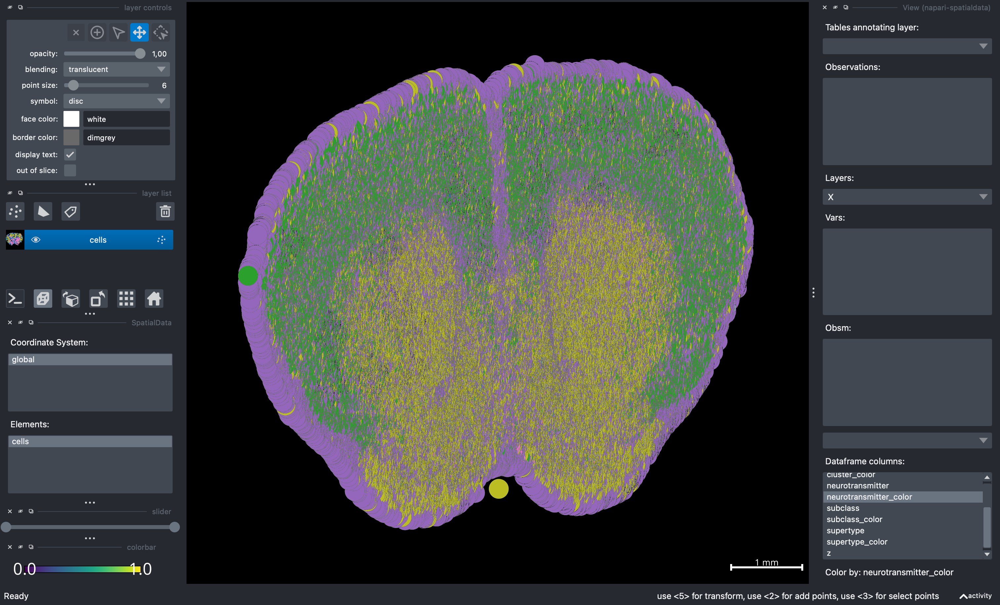

In [5]:
interactive = Interactive(sdata)
interactive.run()
viewer = napari.current_viewer()

2025-03-27 10:44:58.823 python[58160:18683846] +[IMKClient subclass]: chose IMKClient_Modern
2025-03-27 10:44:58.823 python[58160:18683846] +[IMKInputSession subclass]: chose IMKInputSession_Modern
2025-03-27 10:45:02.424 | INFO     | napari_spatialdata._viewer:get_sdata_points:710 - Subsampling points because the number of points exceeds the currently supported 100000. You can change this threshold with ```from napari_spatialdata.constants import config
config.POINT_THRESHOLD = <new_threshold>```
2025-03-27 10:45:02.691 | DEBUG    | napari_spatialdata._view:_on_layer_update:569 - Updating layer.


In [6]:
# Works
viewer.dims.ndisplay = 3
viewer.scale_bar.visible = True
viewer.scale_bar.unit = "mm"
viewer.layers["cells"].border_width=0.01
point_size = 1
viewer.layers["cells"].point_size = np.ones(len(viewer.layers["cells"].data), dtype=int) * point_size


INFO: Selected 100000 points in this slice, use Shift-A to select all points on the layer. (100000 selected)


In [7]:
# WHY???? it is shortened to 100000
display(df_features.shape)
display(adata.obs.shape)
display(viewer.layers["cells"].data.shape)

(372144, 15)

(372144, 21)

(100000, 2)

In [ ]:
viewer.layers["cells"].ndim = 3 # AttributeError: property 'ndim' of 'Points' object has no setter


AttributeError: property 'ndim' of 'Points' object has no setter

In [ ]:
# viewer.layers["cells"].data =

new_data = np.hstack([df_features[["z"]].values[:100000], viewer.layers["cells"].data])
display(new_data.shape)
display(new_data)
viewer.layers["cells"].data = new_data # ValueError: Points dimensions must be equal to ndim

(100000, 3)

array([[9.6       , 4.24013959, 1.71465179],
       [9.6       , 4.27635331, 1.68103004],
       [9.6       , 4.27961324, 1.70749627],
       ...,
       [9.4       , 5.13574753, 9.62842979],
       [9.4       , 5.68705508, 9.61196562],
       [9.4       , 4.90165684, 9.73240361]])

ValueError: Points dimensions must be equal to ndim

In [ ]:
viewer.layers["cells"].scale = (0.2, 1, 1) # ValueError: could not broadcast input array from shape (3,) into shape (2,)

ValueError: could not broadcast input array from shape (3,) into shape (2,)

In [8]:
viewer.close()

2025-03-27 10:46:57.462 | DEBUG    | napari_spatialdata._view:_on_layer_update:569 - Updating layer.


### 2.3. Visualize with pure `napari`

In [9]:
try:
    v.add_points(np.ones((100, 3)), name="dont name anything like this")
    del v.layers["dont name anything like this"]
except:
    v = napari.Viewer(title="MERFISH")

v.dims.ndisplay = 3
v.scale_bar.visible = True
v.scale_bar.unit = "um"

add_points(v, df_features)

Viewer(camera=Camera(center=(9800.0, 5529.380728545668, 5560.708329635792), zoom=np.float64(0.09504278929702557), angles=(np.float64(0.0), np.float64(0.0), np.float64(89.99999999999999)), perspective=0.0, mouse_pan=True, mouse_zoom=True), cursor=Cursor(position=(1.0, 1.0, 0.0), scaled=True, style=<CursorStyle.STANDARD: 'standard'>, size=1.0), dims=Dims(ndim=3, ndisplay=3, order=(0, 1, 2), axis_labels=('0', '1', '2'), rollable=(True, True, True), range=(RangeTuple(start=np.float64(9400.0), stop=np.float64(10200.0), step=np.float64(1.0)), RangeTuple(start=np.float64(2168.161948604719), stop=np.float64(8890.599508486615), step=np.float64(1.0)), RangeTuple(start=np.float64(1157.6960106346892), stop=np.float64(9963.720648636896), step=np.float64(1.0))), margin_left=(0.0, 0.0, 0.0), margin_right=(0.0, 0.0, 0.0), point=(np.float64(9800.0), np.float64(5529.161948604718), np.float64(5560.696010634689)), last_used=0), grid=GridCanvas(stride=1, shape=(-1, -1), enabled=False), layers=[<Points laye

|||
|---|---|
|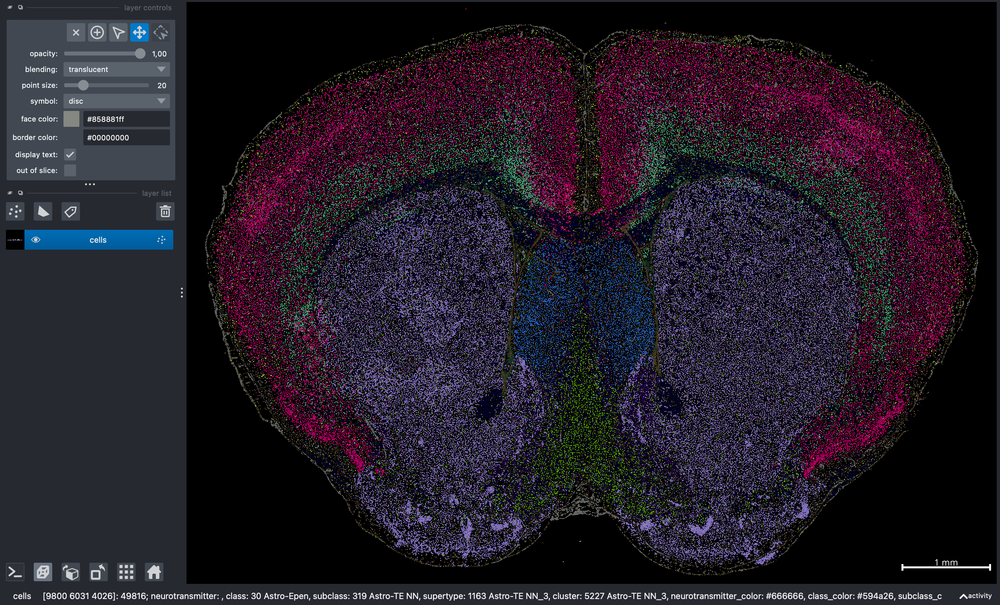|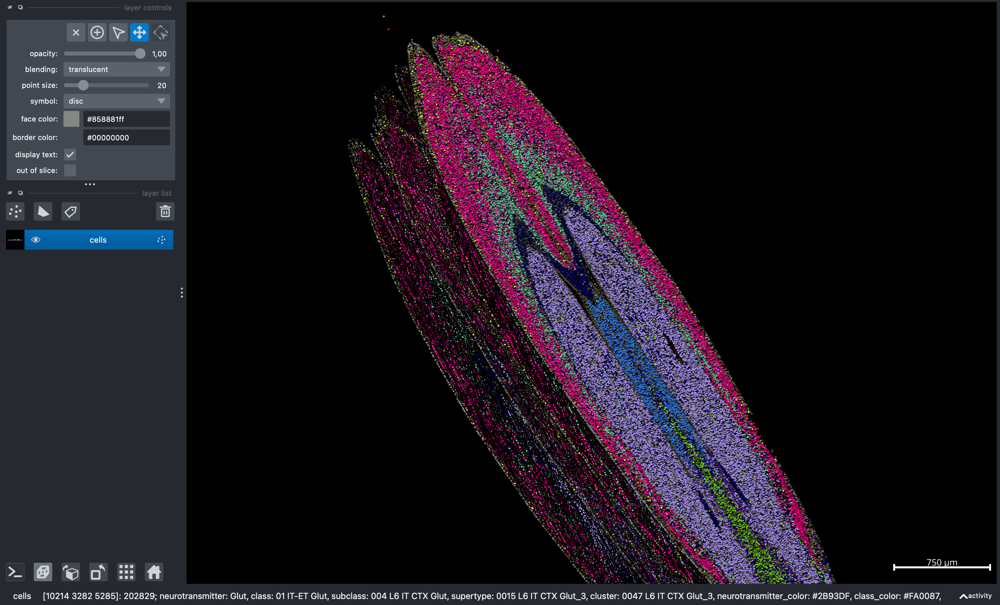|

In [10]:
# compute dims range
available_zs = sorted(df_features["z"].unique().tolist())
step = 200
dims_range = ((min(available_zs)*1e3, max(available_zs)*1e3, step),) + v.dims.range[1:]
dims_range[0]

(9400.0, 10200.0, 200)

In [11]:
# This allows easy navigation through the z-layers

v.dims.ndisplay = 2
v.dims.range = dims_range

@interact
def go_to_z(z=available_zs):
    v.dims.current_step = ((z-min(available_zs))*1e3/step, 0, 0)

interactive(children=(Dropdown(description='z', options=(9.4, 9.6, 9.8, 10.2), value=9.4), Output()), _dom_cla…

## 3. Viz controllers

### 3.1 Slider Point size

Note: 
- Control of point size should be documented / improved because currently not user friendly
- Specifically when you zoom out in dark mode, the points are not visible anymore
- on MacOS there is a upper limit on the size of the points (known issue)
- there is a canvas setting to set minimal size of the points
- light mode might behave differently
- setting the point size need selecting all points (Cmd A) and using the slider, then deselecting all points (Cmd A)
- discussion with napari community for possible evolution of the point size control

Below is a cell that allows control of the point size without selecting the points.

In [12]:
@interact
def change_point_size(size=(1, 100)):
    for layer in v.layers:
        if layer.visible:
            layer.size = size

interactive(children=(IntSlider(value=50, description='size', min=1), Output()), _dom_classes=('widget-interac…

### 3.2 Select slices to display
Example of drop down menu to select the slice to display

In [13]:
available_slices = ["all"] + sorted(df_features["brain_section_label"].unique().tolist())

@interact
def select_slice(slice_=available_slices):
    # Hide all layers
    for layer in v.layers:
        layer.visible = False
    # If layer exists, make it visible
    if slice_ in [layer.name for layer in v.layers]:
        v.layers[slice_].visible = True
        return
    # Case all slices
    if slice_ == "all":
        add_points(v, df_features)
        v.dims.range = dims_range # Reset dims range
        return
    # Case specific slice
    df_features_subset = df_features.query("brain_section_label == @slice_")
    add_points(v, df_features_subset, layer_name=slice_)
    v.dims.range = dims_range # Reset dims range


interactive(children=(Dropdown(description='slice_', options=('all', 'C57BL6J-638850.50', 'C57BL6J-638850.51',…

### 3.3 Select color coded categorical feature to display
In this dataset some categorical features with color code are available:
- class_color
- cluster_color
- subclass_color
- supertype_color
- neurotransmitter_color
... probably also the anatomical region but not retrieved in this derived dataset (TODO)
The transcript counts can be coded with a color map


In [14]:
available_features = ["class_color", "cluster_color", "subclass_color", "supertype_color", "neurotransmitter_color"]
layer_name = "all"

@interact
def select_feature(feature=available_features):
    v.layers[layer_name].face_color = v.layers[layer_name].properties[feature].tolist()
    v.layers[layer_name].visible = True # to force update

interactive(children=(Dropdown(description='feature', options=('class_color', 'cluster_color', 'subclass_color…

### 3.4 Select any categorical feature to display
Todo (color code any category)

### 3.5 Color by continuous variable (float)
- This is just a test in pure napari, but should leverage napari-spatialdata functionalities...
- want control on colormap, contrast_limits, normalization, log scale, etc.

#### Gene selection

In [15]:
available_genes = adata.var_names.tolist()
layer_name = "all"

@interact
def select_gene(gene=available_genes):
    df_features = adata.obs.copy()
    df_features["variable"] = adata[:,[gene]].to_df().values.astype(float)
    df_features = df_features[["variable"] + df_features.columns.difference(["variable"]).tolist()]
    v.layers[layer_name].properties = df_features
    v.layers[layer_name].face_colormap = "viridis"
    v.layers[layer_name].face_color = "variable"

interactive(children=(Dropdown(description='gene', options=('0', '1', '2', '3', '4', '5', '6', '7', '8', '9'),…

#### Face contrast limits control

In [16]:
layer_name = "all"

@interact
def change_contrast_limits(min_=(0, 10), max_=(0, 30)):
    v.layers[layer_name].properties = v.layers[layer_name].properties.copy()
    v.layers[layer_name].face_contrast_limits = (min_, max_)
    v.layers[layer_name].face_colormap = "viridis"
    v.layers[layer_name].visible = True # to force update


interactive(children=(IntSlider(value=5, description='min_', max=10), IntSlider(value=15, description='max_', …

#### Tick box for normalized and tick box for log scale
To do

## 4. Spatial Query

### 4.1. Draw 2D polygons (`Shapes` layer) on the first and last slice with `napari`

... or load the following example

In [17]:
import pickle
# with open("polygons.pkl", "wb") as f:
#     pickle.dump(v.layers["Shapes"].data, f)
with open("polygons.pkl", "rb") as f:
    polygons = pickle.load(f)
v.add_shapes(polygons, shape_type="polygon", opacity=0.7, name="Shapes")

<Shapes layer 'Shapes' at 0x328d27080>

In [18]:
# Each time you add a new layer, the z range falls back to [0, 800], so you need to run this again
v.dims.range = dims_range

In [61]:
v.layers["Shapes"].data[0][:,::-1]

array([[4007.3987, 4765.119 , 9400.    ],
       [3420.7766, 4765.119 , 9400.    ],
       [3214.2195, 4822.9556, 9400.    ],
       [3082.023 , 4880.7915, 9400.    ],
       [2982.8755, 4955.152 , 9400.    ],
       [2817.63  , 5161.709 , 9400.    ],
       [2693.6956, 5442.627 , 9400.    ],
       [2644.1218, 5640.9214, 9400.    ],
       [2627.5972, 5930.1016, 9400.    ],
       [2660.6462, 6177.97  , 9400.    ],
       [2801.1052, 6450.6255, 9400.    ],
       [2916.777 , 6574.5596, 9400.    ],
       [3148.121 , 6748.068 , 9400.    ],
       [3288.58  , 6822.428 , 9400.    ],
       [3404.252 , 6863.7397, 9400.    ],
       [3751.268 , 6863.7397, 9400.    ],
       [3924.776 , 6814.166 , 9400.    ],
       [4147.8574, 6673.707 , 9400.    ],
       [4337.89  , 6516.7236, 9400.    ],
       [4503.1357, 6326.6914, 9400.    ],
       [4618.808 , 6120.1343, 9400.    ],
       [4676.644 , 5888.79  , 9400.    ],
       [4684.9062, 5731.8066, 9400.    ],
       [4668.3813, 5649.184 , 9400

### 4.2. Transform Shapes2D to GeoDataFrame

In [68]:
shapes_layer_name = "Shapes"
tolerance = 0.1
gdf = napari_shapes_to_gdf(shapes_layer_name, tolerance)
gdf

,geometry
0,"MULTIPOLYGON Z (((4007.399 4765.119 9400, 3420..."


### 4.3. Transform Shapes2D to Multipolygon 3D Shape with ConvexHull

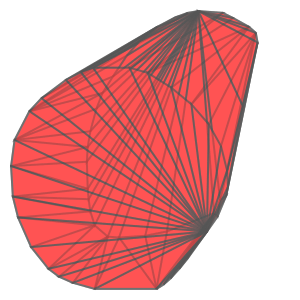

In [71]:
get_surfaces(gdf,0)

### 4.4. Visualize in `napari`, with gdf only

In [72]:
all_coords, faces, indices = get_geometry(gdf)

surface_layer_name = "Surface"
v.add_surface((all_coords, faces, indices), name=surface_layer_name, colormap="gray_r")
v.layers[surface_layer_name].colormap = "gray_r"
v.layers[surface_layer_name].opacity = 0.5

100%|██████████| 1/1 [00:00<00:00, 198.55it/s]


## 5. Delaunay Alpha shape -> Shape3D

https://stackoverflow.com/questions/69110871/alpha-shapes-in-3d-follow-up

https://stackoverflow.com/questions/78252343/how-can-i-generate-a-concave-hull-of-3d-points

In [22]:

points = np.vstack([np.array(geom.exterior.coords) for geom in gdf.loc[0, "geometry"].geoms])

@interact
def select_alpha_pyvista(alpha=(0, 1500, 100)):
    vertices, faces = alpha_shape_pyvista(points, alpha)
    if "alpha_shape_pyvista" in v.layers:
        v.layers.pop("alpha_shape_pyvista")
    v.add_surface((vertices, faces), name="alpha_shape_pyvista")


interactive(children=(IntSlider(value=700, description='alpha', max=1500, step=100), Output()), _dom_classes=(…

In [23]:

points = np.vstack([np.array(geom.exterior.coords) for geom in gdf.loc[0, "geometry"].geoms])

@interact
def select_alpha_scipy(alpha=(0, 1500, 100)):
    vertices, faces = alpha_shape_scipy(points, alpha)
    if "alpha_shape_scipy" in v.layers:
        v.layers.pop("alpha_shape_scipy")
    v.add_surface((vertices, faces), name="alpha_shape_scipy")


interactive(children=(IntSlider(value=700, description='alpha', max=1500, step=100), Output()), _dom_classes=(…

## 6. Mesh -> Section of 3D mesh

In [ ]:
points = np.vstack([np.array(geom.exterior.coords) for geom in gdf.loc[0, "geometry"].geoms])
alpha_shape = get_alpha_shape_pyvista_object(points, 1000)

z = 9800
def get_intersection_points(alpha_shape, z):
    intersection_points = alpha_shape.slice((1, 0, 0), (z, 0, 0)).points
    return intersection_points

def get_intersection_polygon_2d(intersection_points):
    intersection_points_2d = np.array(intersection_points)[:,1:]
    polygon = Polygon(intersection_points_2d).convex_hull
    return polygon

intersection_points = get_intersection_points(alpha_shape, z)
v.add_points(intersection_points, size=50, name="intersection_points")
polygon_2d = get_intersection_polygon_2d(intersection_points)

In [73]:
gdf_new_polygon = gpd.GeoDataFrame(geometry=[MultiPolygon([polygon_2d])])
gdf_new_polygon["geometry"] = gdf_new_polygon.force_3d(z=z)
gdf_new_polygon

,geometry
0,"MULTIPOLYGON Z (((5950.757 2987.007 9800, 5822..."


In [ ]:
gdfs = []
for z in [9600, 9800]:
    intersection_points = get_intersection_points(alpha_shape, z)
    polygon_2d = get_intersection_polygon_2d(intersection_points)
    gdf_new_polygon = gpd.GeoDataFrame(geometry=[MultiPolygon([polygon_2d])])
    gdf_new_polygon["geometry"] = gdf_new_polygon.force_3d(z=z)
    gdfs.append(gdf_new_polygon)
gdfs.append(gdf) # contains both starting polygons

In [93]:
new_gdf = pd.concat(gdfs)
new_gdf

,geometry
0,"MULTIPOLYGON Z (((5940.429 2807.302 9600, 5876..."
0,"MULTIPOLYGON Z (((5950.757 2987.007 9800, 5822..."
0,"MULTIPOLYGON Z (((4007.399 4765.119 9400, 3420..."


-> Consider merging all polygons from all Z into a single MultiPolygon Z

## 8. Select a cluster -> Create a mesh

## 9. Intersection of two meshes

## 10. Stats within a mesh (table of distribution by cluster, stats of gene expression...)